## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:75: DeprecationWarning: elementwise != comparison failed; this will raise an error in the future.


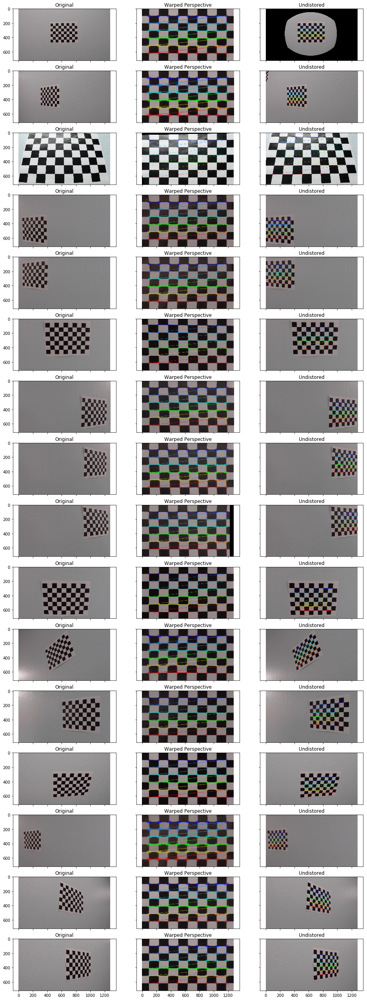

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    warped, M = [], None
    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return undist, warped, M
    
cam_mtx = None
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
imgs = []
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
        undist, warped, M = corners_unwarp(img, nx, ny, mtx, dist)
        if warped != []:
            imgs.append((img, warped, undist))
            cam_mtx= mtx
            
f, axes = plt.subplots(len(imgs), 3, sharex='col', sharey='row', figsize=(16, 46))
for (image, warped, undist), axis in zip(imgs, axes):
    axis[0].imshow(image)
    axis[0].set_title('Original')
    axis[1].imshow(warped)
    axis[1].set_title('Warped Perspective')
    axis[2].imshow(undist)
    axis[2].set_title('Undistored')

plt.show()
cv2.destroyAllWindows()

## Apply a distortion correction to raw images.

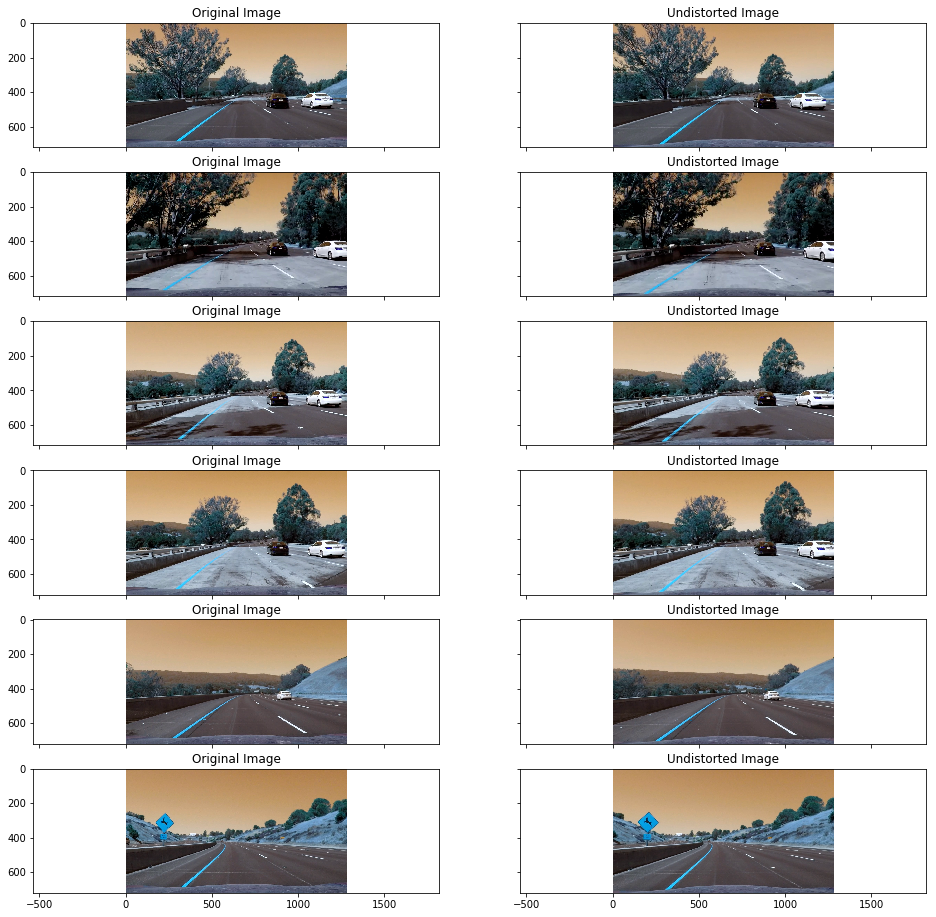

In [2]:
# Make a list of calibration images
test_images = glob.glob('test_images/test*.jpg')
mtx = cam_mtx
def undistort(img, objpoints, imgpoints, mtx):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], mtx, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

def show_undistorted(images, mtx):
    undist_list = []
    f, axes = plt.subplots(len(images), 2, sharex='col', sharey='row', figsize=(16, 16))
    for axis, fname in zip(axes, images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], mtx, None)
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        undist_list.append(undist)
        axis[0].imshow(img)
        axis[0].set_title('Original Image')
        axis[1].imshow(undist)
        axis[1].set_title('Undistorted Image')
    plt.show()
    return undist_list
undist = show_undistorted(test_images, cam_mtx)

## Use color transforms, gradients, etc., to create a thresholded binary image.

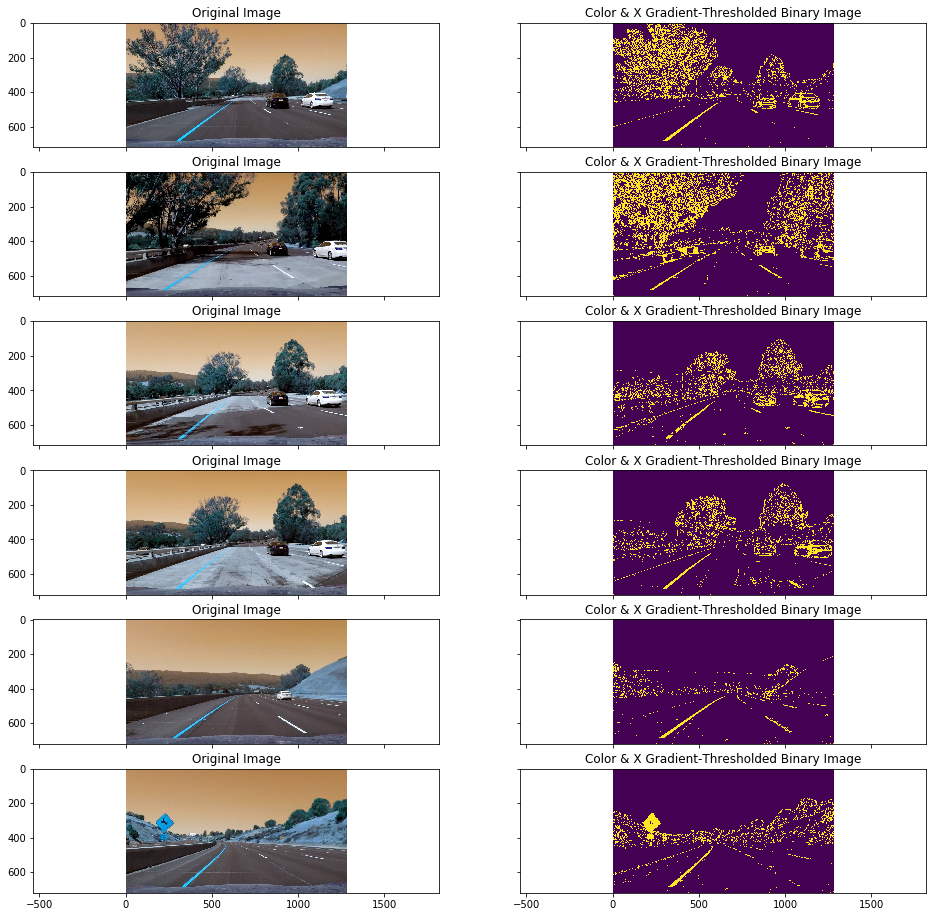

In [3]:
def color_xgrad_bin_pipeline(img, xgrad_thresh=(20, 100), s_thresh=(170,255)):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = xgrad_thresh[0]
    thresh_max = xgrad_thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = s_thresh[0]
    s_thresh_max = s_thresh[1]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary
    
def show_color_xgrad_bin(images, mtx):
    color_xgrad_bin_list = []
    f, axes = plt.subplots(len(images), 2, sharex='col', sharey='row', figsize=(16, 16))
    for axis, fname in zip(axes, images):
        img = cv2.imread(fname)
        
        color_xgrad_binary = color_xgrad_bin_pipeline(img)
        color_xgrad_bin_list.append(color_xgrad_binary)
        axis[0].imshow(img)
        axis[0].set_title('Original Image')
        axis[1].imshow(color_xgrad_binary)
        axis[1].set_title('Color & X Gradient-Thresholded Binary Image')

    plt.show()
    return color_xgrad_bin_list

color_xgrad_binaries = show_color_xgrad_bin(test_images, cam_mtx)

## Apply a perspective transform to rectify binary image ("birds-eye view").

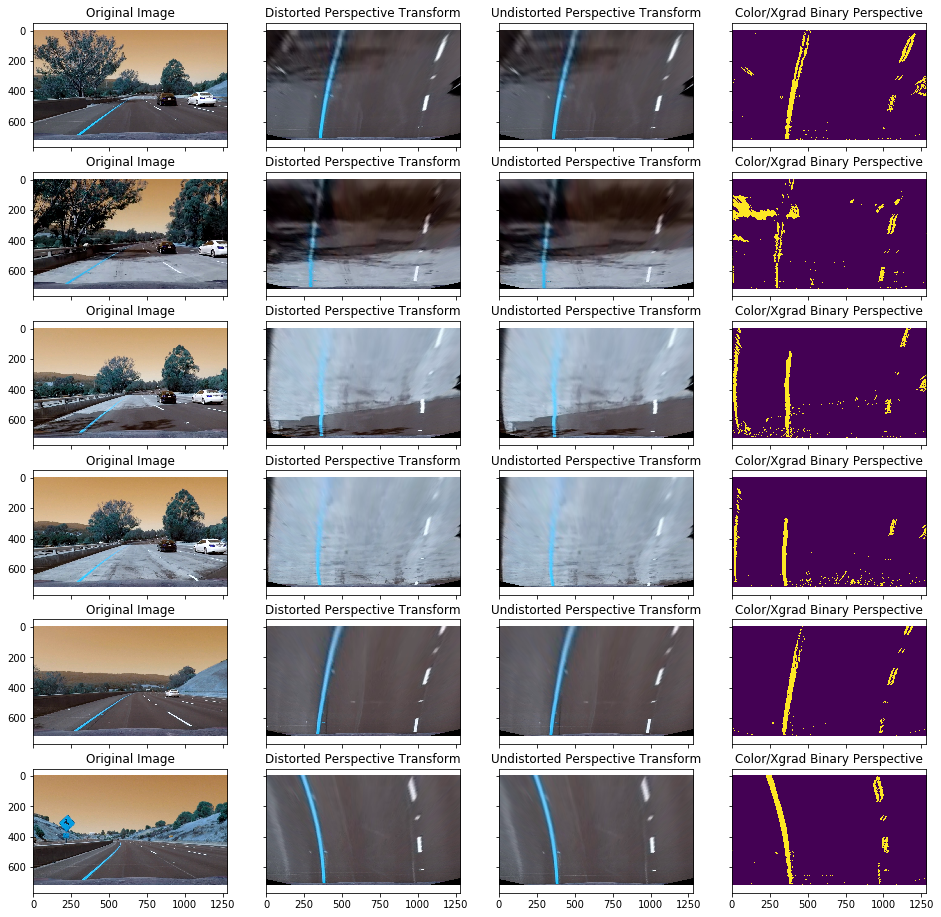

In [4]:
def warper(img):
    img_size = (img.shape[1], img.shape[0])
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
    # Destination points are chosen such that straight lanes appear more or less parallel in the transformed image.
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size , flags=cv2.INTER_LINEAR)
    return warped, M_inv

f, axes = plt.subplots(len(test_images), 4, sharex='col', sharey='row', figsize=(16, 16))
for fname, axis in zip(test_images, axes):
    img = cv2.imread(fname)
    warped, M_inv = warper(img)
    undist_warped, undist_M_inv = warper(undistort(img, objpoints, imgpoints, mtx))
    color_xgrad_undist_warped = color_xgrad_bin_pipeline(undist_warped)
    axis[0].imshow(img)
    axis[0].set_title('Original Image')
    axis[1].imshow(warped)
    axis[1].set_title('Distorted Perspective Transform')
    axis[2].imshow(undist_warped)
    axis[2].set_title('Undistorted Perspective Transform')
    axis[3].imshow(color_xgrad_undist_warped)
    axis[3].set_title('Color/Xgrad Binary Perspective')

plt.show()
cv2.destroyAllWindows()

## Detect lane pixels and fit to find the lane boundary.

In [5]:
def calculate_curvature(binary_warped, left_fit, right_fit, leftx, rightx, lefty, righty):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    left_y_eval = np.max(lefty)
    right_y_eval = np.max(righty)
    left_curverad = ((1 + (2*left_fit[0]*left_y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*right_y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # Example values: 1926.74 1908.48
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curve_radius = ((1 + (2*left_fit_cr[0]*left_y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curve_radius = ((1 + (2*right_fit_cr[0]*right_y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters

    # Example values: 632.1 m    626.2 m
    
    ratio = left_curve_radius / right_curve_radius
    if ratio < 0.66 or ratio > 1.5:
        print('Warning: shitty ratio {}'.format(ratio))
    
    lane_leftx = left_fit[0] * (img.shape[0] - 1) ** 2 + left_fit[1] * (img.shape[0] - 1) + left_fit[2]
    lane_rightx = right_fit[0] * (img.shape[0] - 1) ** 2 + right_fit[1] * (img.shape[0] - 1) + right_fit[2]

    car_pos = ((img.shape[1] / 2) - ((lane_leftx + lane_rightx) / 2)) * xm_per_pix 

    curvature = (left_curve_radius + right_curve_radius) / 2
    
    return (curvature, left_curve_radius, right_curve_radius, car_pos.round(2), ratio)

def detect_and_fit(binary_warped, hist_axis=None, lane_axis=None, pers_axis=None, undist=None):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    hist_max = np.argmax(histogram)
    if hist_max < 373:
        hist_max = 373
    flip = np.vectorize(lambda x: hist_max-x)
    flipped_hist = flip(histogram)
    
    if hist_axis is not None:
        hist_axis.plot(flipped_hist)
        hist_axis.set_title('Binary Warped Point Histogram')
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 60 #50 #100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    if lane_axis is not None:
        lane_axis.imshow(result)
        lane_axis.plot(left_fitx, ploty, color='yellow')
        lane_axis.plot(right_fitx, ploty, color='yellow')
        lane_axis.set_title('Fitted Perspective Image')
    
    curvature = calculate_curvature(binary_warped, left_fit, right_fit, leftx, rightx, lefty, righty)

    if pers_axis is not None and undist is not None:
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))]) # left_fitx
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))]) # right_fitx
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, M_inv, (image.shape[1], image.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
        pers_axis.imshow(result)
    
    return result, curvature

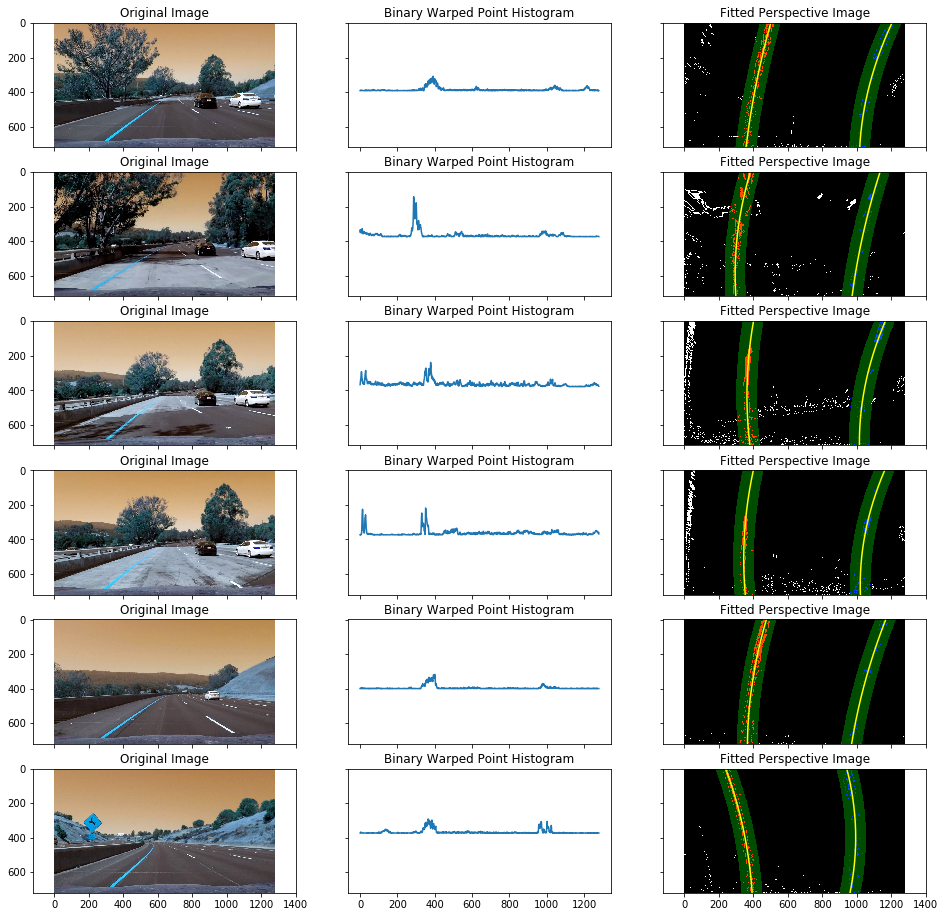

In [6]:
f, axes = plt.subplots(len(test_images), 3, sharex='col', sharey='row', figsize=(16, 16))
fits = []
for fname, axis in zip(test_images, axes):
    img = cv2.imread(fname)
    undist_warped, M_inv = warper(undistort(img, objpoints, imgpoints, mtx))
     
    axis[0].imshow(img)
    axis[0].set_title('Original Image')
    # s_thresh = (170,255)
    fitted_img, curvature = detect_and_fit(color_xgrad_bin_pipeline(undist_warped, 
                                                        xgrad_thresh=(15, 25), s_thresh=(170,200)), 
                                                        axis[1], axis[2])
    fits.append((fitted_img, curvature))
    
plt.show()
cv2.destroyAllWindows()

## Determine the curvature of the lane and vehicle position with respect to center.

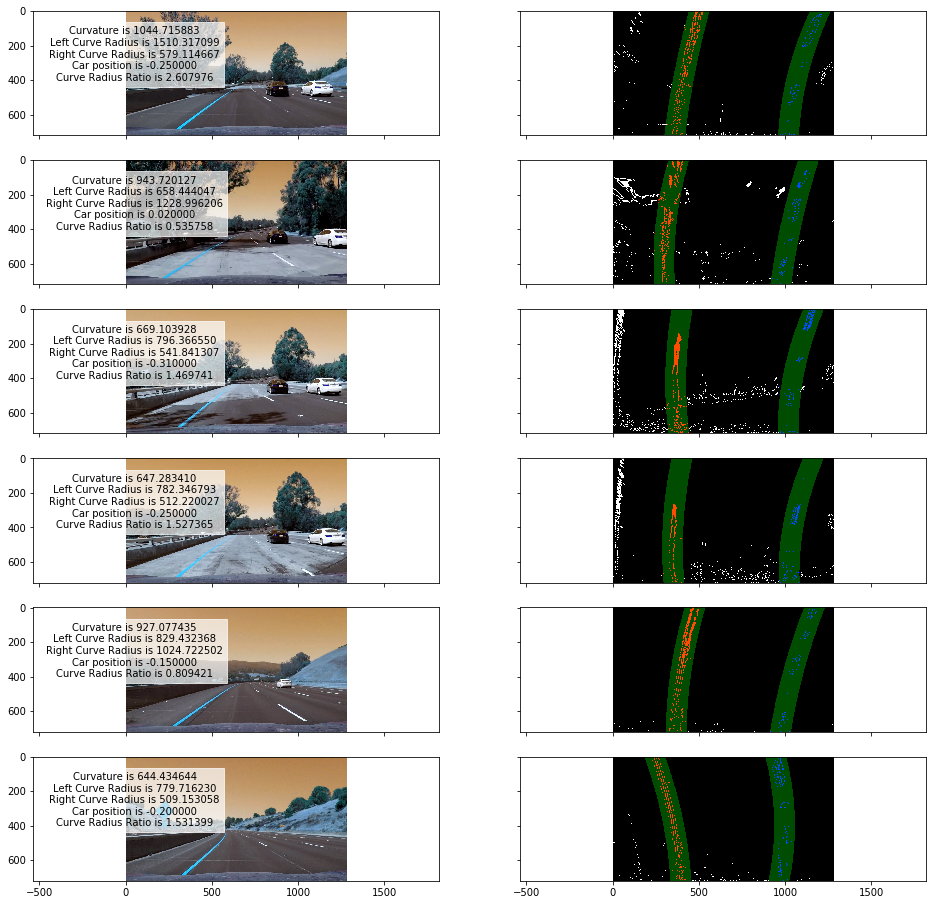

In [7]:
f, axes = plt.subplots(len(test_images), 2, sharex='col', sharey='row', figsize=(16, 16))
for (fname, (fitted, curvature)), axis in zip(zip(test_images, fits), axes):
    img = cv2.imread(fname)
    axis[0].imshow(img)
    axis[1].imshow(fitted)
    curvature, left_curverad, right_curverad, car_pos, ratio = curvature
    plt.text(0.25, 0.65,"Curvature is {:5f}\nLeft Curve Radius is {:5f}\n"
             "Right Curve Radius is {:5f}\nCar position is {:5f}\nCurve Radius Ratio is {:5f}"
             .format(curvature, left_curverad, right_curverad, car_pos, ratio), ha='center', 
             va='center', transform=axis[0].transAxes, bbox=dict(color='white', alpha=0.7))


## Warp the detected lane boundaries back onto the original image.

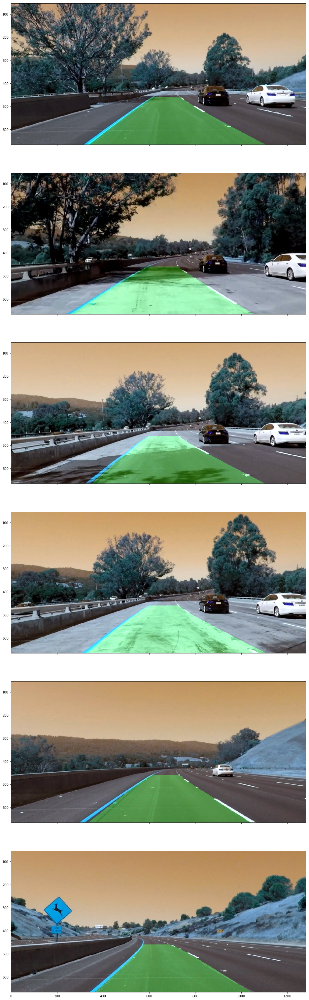

In [8]:
f, axes = plt.subplots(len(test_images), 1, sharex='col', sharey='row', figsize=(16, 55))
fits = []

for fname, axis in zip(test_images, axes):
    img = cv2.imread(fname)
    undist = undistort(img, objpoints, imgpoints, mtx)
    undist_warped, M_inv = warper(undist)

    fitted_img, curvature = detect_and_fit(color_xgrad_bin_pipeline(undist_warped, 
                                                        xgrad_thresh=(15, 25), s_thresh=(170,200)), 
                                                        None, None, pers_axis=axis, undist=undist)
    fits.append((fitted_img, curvature))
    
    
plt.show()
cv2.destroyAllWindows()

In [9]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(img):
    undist = undistort(img, objpoints, imgpoints, mtx)
    undist_warped, M_inv = warper(undist)

    result, curvature = detect_and_fit(color_xgrad_bin_pipeline(undist_warped, 
                                                        xgrad_thresh=(15, 25), s_thresh=(170,200)), 
                                                        None, None, pers_axis=axis, undist=undist)
    return result

fname = 'project_video'
file_output = fname+"_lanes.mp4"
clip1 = VideoFileClip(fname+".mp4").subclip(0,5)
video_clip = clip1.fl_image(process_image) 

try:
    %time video_clip.write_videofile(file_output, audio=False)
    print('Done')
except Exception as e:
    print(e)

[MoviePy] >>>> Building video project_video_lanes.mp4
[MoviePy] Writing video project_video_lanes.mp4


  6%|▌         | 7/126 [00:06<01:57,  1.02it/s]

  6%|▋         | 8/126 [00:07<01:55,  1.02it/s]

  7%|▋         | 9/126 [00:08<01:54,  1.02it/s]

  8%|▊         | 10/126 [00:09<01:53,  1.02it/s]

  9%|▊         | 11/126 [00:10<01:52,  1.02it/s]

 10%|▉         | 12/126 [00:11<01:50,  1.03it/s]

 11%|█         | 14/126 [00:13<01:48,  1.03it/s]

 13%|█▎        | 16/126 [00:15<01:47,  1.03it/s]

 17%|█▋        | 22/126 [00:21<01:41,  1.03it/s]

 18%|█▊        | 23/126 [00:22<01:40,  1.03it/s]

 40%|███▉      | 50/126 [00:48<01:12,  1.04it/s]

 40%|████      | 51/126 [00:49<01:11,  1.05it/s]

 42%|████▏     | 53/126 [00:51<01:10,  1.04it/s]

 43%|████▎     | 54/126 [00:52<01:09,  1.03it/s]

 44%|████▎     | 55/126 [00:53<01:08,  1.03it/s]

 44%|████▍     | 56/126 [00:54<01:08,  1.03it/s]

 45%|████▌     | 57/126 [00:55<01:07,  1.03it/s]

 46%|████▌     | 58/126 [00:56<01:06,  1.03it/s]

 47%|████▋     | 59/126 [00:57<01:05,  1.03it/s]

 51%|█████     | 64/126 [01:02<01:00,  1.02it/s]

 52%|█████▏    | 65/126 [01:03<00:59,  1.02it/s]

 57%|█████▋    | 72/126 [01:10<00:53,  1.00it/s]

 58%|█████▊    | 73/126 [01:10<00:52,  1.01it/s]

 59%|█████▊    | 74/126 [01:11<00:51,  1.01it/s]

 60%|█████▉    | 75/126 [01:12<00:50,  1.01it/s]

 60%|██████    | 76/126 [01:13<00:49,  1.02it/s]

 61%|██████    | 77/126 [01:14<00:48,  1.02it/s]

 62%|██████▏   | 78/126 [01:15<00:47,  1.02it/s]

 63%|██████▎   | 79/126 [01:16<00:46,  1.02it/s]

 63%|██████▎   | 80/126 [01:17<00:45,  1.02it/s]

 64%|██████▍   | 81/126 [01:18<00:44,  1.02it/s]

 65%|██████▌   | 82/126 [01:19<00:43,  1.02it/s]

 66%|██████▌   | 83/126 [01:20<00:42,  1.02it/s]

 67%|██████▋   | 84/126 [01:21<00:41,  1.02it/s]

 77%|███████▋  | 97/126 [01:34<00:28,  1.00it/s]

 78%|███████▊  | 98/126 [01:35<00:27,  1.01it/s]

 83%|████████▎ | 104/126 [01:41<00:21,  1.03it/s]

 83%|████████▎ | 105/126 [01:42<00:20,  1.03it/s]

 87%|████████▋ | 110/126 [01:47<00:15,  1.05it/s]

 88%|████████▊ | 111/126 [01:48<00:14,  1.04it/s]

 89%|████████▉ | 112/126 [01:49<00:13,  1.04it/s]

 92%|█████████▏| 116/126 [01:53<00:09,  1.04it/s]

 93%|█████████▎| 117/126 [01:54<00:08,  1.04it/s]

 99%|█████████▉| 125/126 [02:01<00:00,  1.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_lanes.mp4 

CPU times: user 3min 19s, sys: 4.33 s, total: 3min 23s
Wall time: 2min 2s
Done


In [10]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(file_output))

In [11]:
fname = 'harder_challenge_video'
file_output = fname+"_lanes.mp4"
clip1 = VideoFileClip(fname+".mp4").subclip(0,5)
video_clip = clip1.fl_image(process_image) 

try:
    %time video_clip.write_videofile(file_output, audio=False)
    print('Done')
except Exception as e:
    print(e)

[MoviePy] >>>> Building video harder_challenge_video_lanes.mp4
[MoviePy] Writing video harder_challenge_video_lanes.mp4


  6%|▋         | 8/126 [00:07<01:54,  1.03it/s]

 10%|▉         | 12/126 [00:11<01:50,  1.03it/s]

 10%|█         | 13/126 [00:12<01:49,  1.03it/s]

 11%|█         | 14/126 [00:13<01:48,  1.03it/s]

 12%|█▏        | 15/126 [00:14<01:47,  1.03it/s]

 13%|█▎        | 16/126 [00:15<01:46,  1.04it/s]

 16%|█▌        | 20/126 [00:19<01:41,  1.04it/s]

 17%|█▋        | 22/126 [00:21<01:39,  1.04it/s]

 18%|█▊        | 23/126 [00:22<01:39,  1.04it/s]

 19%|█▉        | 24/126 [00:23<01:37,  1.05it/s]

 20%|█▉        | 25/126 [00:24<01:37,  1.04it/s]

 21%|██▏       | 27/126 [00:26<01:36,  1.03it/s]

 23%|██▎       | 29/126 [00:28<01:34,  1.02it/s]

 24%|██▍       | 30/126 [00:29<01:33,  1.03it/s]

 25%|██▍       | 31/126 [00:30<01:32,  1.02it/s]

 25%|██▌       | 32/126 [00:31<01:32,  1.02it/s]

 26%|██▌       | 33/126 [00:32<01:30,  1.03it/s]

 27%|██▋       | 34/126 [00:32<01:29,  1.03it/s]

 28%|██▊       | 35/126 [00:33<01:28,  1.02it/s]

 29%|██▊       | 36/126 [00:34<01:27,  1.03it/s]

 29%|██▉       | 37/126 [00:35<01:26,  1.03it/s]

 30%|███       | 38/126 [00:36<01:25,  1.03it/s]

 31%|███       | 39/126 [00:37<01:24,  1.02it/s]

 32%|███▏      | 40/126 [00:38<01:23,  1.03it/s]

 33%|███▎      | 41/126 [00:39<01:22,  1.03it/s]

 33%|███▎      | 42/126 [00:40<01:21,  1.03it/s]

 34%|███▍      | 43/126 [00:41<01:20,  1.03it/s]

 35%|███▍      | 44/126 [00:42<01:20,  1.02it/s]

 37%|███▋      | 47/126 [00:45<01:17,  1.02it/s]

 39%|███▉      | 49/126 [00:47<01:14,  1.04it/s]

 40%|███▉      | 50/126 [00:48<01:14,  1.03it/s]

 40%|████      | 51/126 [00:49<01:12,  1.03it/s]

 43%|████▎     | 54/126 [00:52<01:11,  1.00it/s]

 44%|████▎     | 55/126 [00:53<01:10,  1.01it/s]

 46%|████▌     | 58/126 [00:56<01:08,  1.00s/it]

 47%|████▋     | 59/126 [00:57<01:06,  1.00it/s]

 48%|████▊     | 60/126 [00:58<01:05,  1.00it/s]

 48%|████▊     | 61/126 [00:59<01:04,  1.00it/s]

 49%|████▉     | 62/126 [01:00<01:03,  1.00it/s]

 50%|█████     | 63/126 [01:01<01:03,  1.00s/it]

 51%|█████     | 64/126 [01:02<01:02,  1.01s/it]

 52%|█████▏    | 65/126 [01:03<01:01,  1.00s/it]

 52%|█████▏    | 66/126 [01:04<01:00,  1.00s/it]

 53%|█████▎    | 67/126 [01:05<00:58,  1.00it/s]

 54%|█████▍    | 68/126 [01:06<00:57,  1.00it/s]

 55%|█████▍    | 69/126 [01:07<00:57,  1.00s/it]

 56%|█████▌    | 70/126 [01:08<00:56,  1.01s/it]

 56%|█████▋    | 71/126 [01:09<00:54,  1.00it/s]

 57%|█████▋    | 72/126 [01:10<00:54,  1.00s/it]

 58%|█████▊    | 73/126 [01:11<00:52,  1.01it/s]

 59%|█████▊    | 74/126 [01:12<00:51,  1.01it/s]

 60%|█████▉    | 75/126 [01:13<00:50,  1.02it/s]

 61%|██████    | 77/126 [01:15<00:48,  1.01it/s]

 62%|██████▏   | 78/126 [01:16<00:47,  1.01it/s]

 63%|██████▎   | 79/126 [01:17<00:46,  1.01it/s]

 63%|██████▎   | 80/126 [01:18<00:45,  1.00it/s]

 66%|██████▌   | 83/126 [01:21<00:42,  1.01it/s]

 67%|██████▋   | 84/126 [01:22<00:41,  1.01it/s]

 67%|██████▋   | 85/126 [01:23<00:40,  1.02it/s]

 68%|██████▊   | 86/126 [01:24<00:39,  1.01it/s]

 69%|██████▉   | 87/126 [01:25<00:38,  1.01it/s]

 70%|██████▉   | 88/126 [01:26<00:37,  1.01it/s]

 71%|███████   | 89/126 [01:27<00:36,  1.01it/s]

 71%|███████▏  | 90/126 [01:28<00:35,  1.01it/s]

 72%|███████▏  | 91/126 [01:29<00:34,  1.00it/s]

 73%|███████▎  | 92/126 [01:30<00:33,  1.00it/s]

 74%|███████▍  | 93/126 [01:31<00:32,  1.01it/s]

 75%|███████▍  | 94/126 [01:32<00:31,  1.01it/s]

 75%|███████▌  | 95/126 [01:33<00:30,  1.01it/s]

 76%|███████▌  | 96/126 [01:34<00:30,  1.00s/it]

 78%|███████▊  | 98/126 [01:36<00:27,  1.00it/s]

 79%|███████▊  | 99/126 [01:37<00:26,  1.01it/s]

 79%|███████▉  | 100/126 [01:38<00:25,  1.02it/s]

 80%|████████  | 101/126 [01:39<00:24,  1.01it/s]

 81%|████████  | 102/126 [01:40<00:23,  1.01it/s]

 82%|████████▏ | 103/126 [01:41<00:23,  1.01s/it]

 83%|████████▎ | 104/126 [01:42<00:22,  1.01s/it]

 83%|████████▎ | 105/126 [01:43<00:21,  1.02s/it]

 84%|████████▍ | 106/126 [01:44<00:20,  1.03s/it]

 85%|████████▍ | 107/126 [01:45<00:19,  1.03s/it]

 87%|████████▋ | 109/126 [01:47<00:17,  1.03s/it]

 87%|████████▋ | 110/126 [01:48<00:16,  1.02s/it]

 88%|████████▊ | 111/126 [01:49<00:15,  1.01s/it]

 89%|████████▉ | 112/126 [01:50<00:14,  1.00s/it]

 91%|█████████▏| 115/126 [01:53<00:11,  1.03s/it]

 93%|█████████▎| 117/126 [01:55<00:09,  1.04s/it]

 94%|█████████▎| 118/126 [01:56<00:08,  1.06s/it]

 94%|█████████▍| 119/126 [01:57<00:07,  1.08s/it]

 95%|█████████▌| 120/126 [01:59<00:06,  1.09s/it]

 97%|█████████▋| 122/126 [02:01<00:04,  1.14s/it]

 98%|█████████▊| 123/126 [02:02<00:03,  1.15s/it]

 98%|█████████▊| 124/126 [02:03<00:02,  1.15s/it]

 99%|█████████▉| 125/126 [02:04<00:01,  1.19s/it]

[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_lanes.mp4 

CPU times: user 3min 23s, sys: 4.89 s, total: 3min 28s
Wall time: 2min 6s
Done


In [12]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(file_output))

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.